# Fig 6, CODEX

In [1]:
import muon as mu
import scanpy as sc
import pandas as pd
import numpy as np
import plotnine as pn
import sys
sys.path.append('..')
from util import load_CODEX
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png')

/tmp/ipykernel_202654/2968057973.py:12: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`


In [2]:
# Suppl Table S8
df_path = pd.read_excel('./Table_S8_CODEX_pathology_concordance.xlsx').drop(['Accession number', 'Sample','Block type'], axis=1)

,unique_region,Initial block diagnosis,% invasive,% dysplasia,% metaplasia,% normal squamous,% HG dysplasia,% LG dysplasia,% Glandular,% metaplasia (not glandular),consensus diagnosis,Sub diagnosis
0,E08_reg001,DT,3.333333,53.333333,43.333333,0.0,48.333333,5.0,0.0,43.333333,D,MD
1,E08_reg002,NS,0.000000,0.000000,0.000000,100.0,0.000000,0.0,0.0,0.000000,NE,NE
2,E08_reg003,NS,0.000000,0.000000,0.000000,100.0,0.000000,0.0,0.0,0.000000,NE,NE
3,E08_reg004,MT,60.000000,33.333333,6.666667,0.0,33.333333,0.0,0.0,6.666667,T,MDT
4,E08_reg005,MT,50.000000,30.000000,20.000000,0.0,30.000000,0.0,0.0,20.000000,T,MDT


In [3]:
mdata = load_CODEX()

/opt/conda/lib/python3.11/site-packages/mudata/_core/mudata.py:1531: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.
/opt/conda/lib/python3.11/site-packages/mudata/_core/mudata.py:931: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/opt/conda/lib/python3.11/site-packages/mudata/_core/mudata.py:1429: FutureWarning: From 0.4 .update() will not pull obs/var columns from individual modalities by default anymore. Set mudata.set_options(pull_on_update=False) to adopt the new behaviour, which will become the default. Use new pull_obs/pull_var and push_obs/push_var methods for more flexibility.


# Fig6B

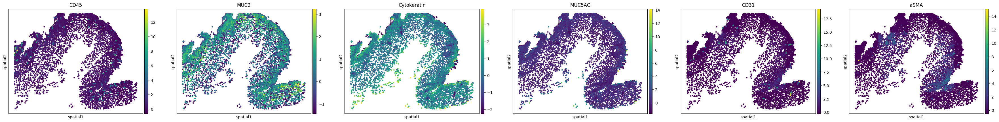

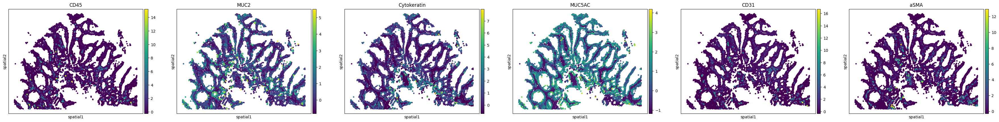

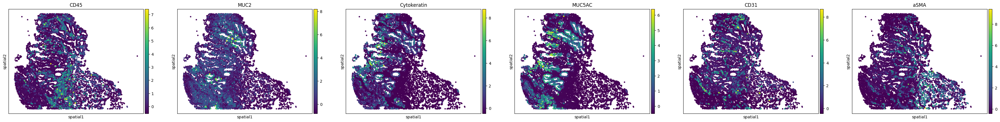

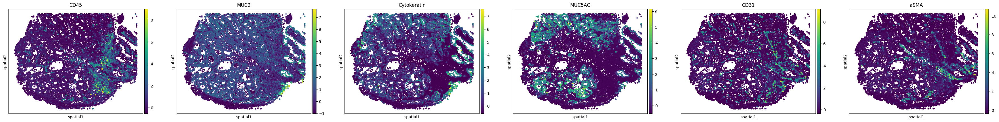

In [5]:
for sample in ['E08_reg002','E08_reg007','E08_reg001','E08_reg004']:
    sc.pl.embedding(mdata[sample], basis='spatial', color=['CD45', 'MUC2','Cytokeratin' , 'MUC5AC',  'CD31', 'aSMA',],size=50, ncols=6)

# Fig6C

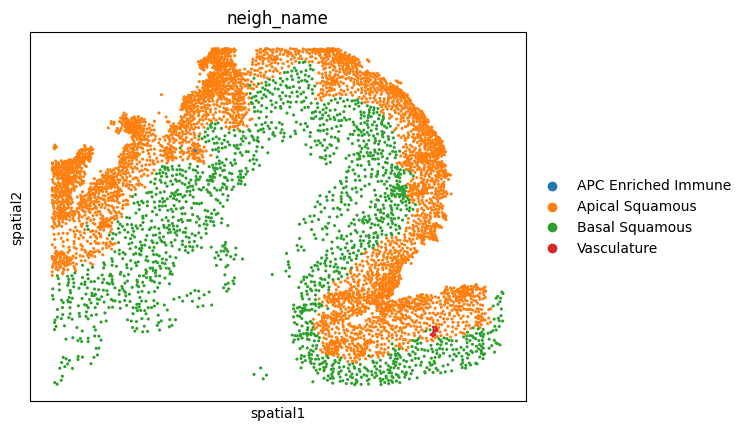

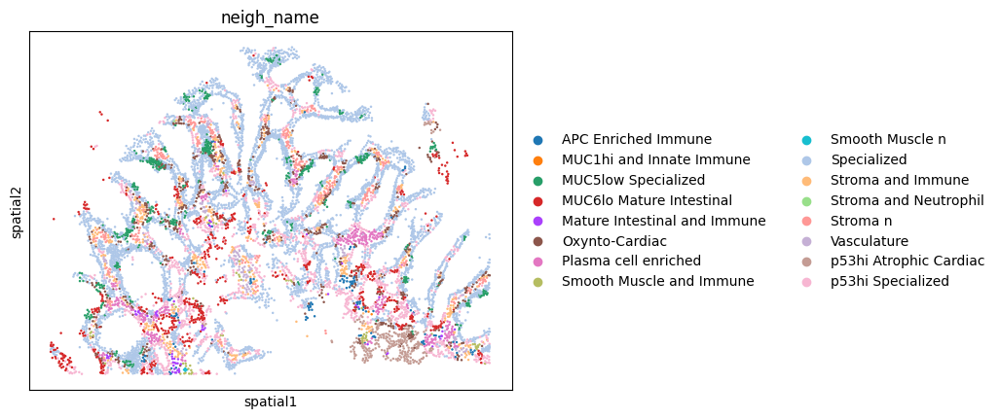

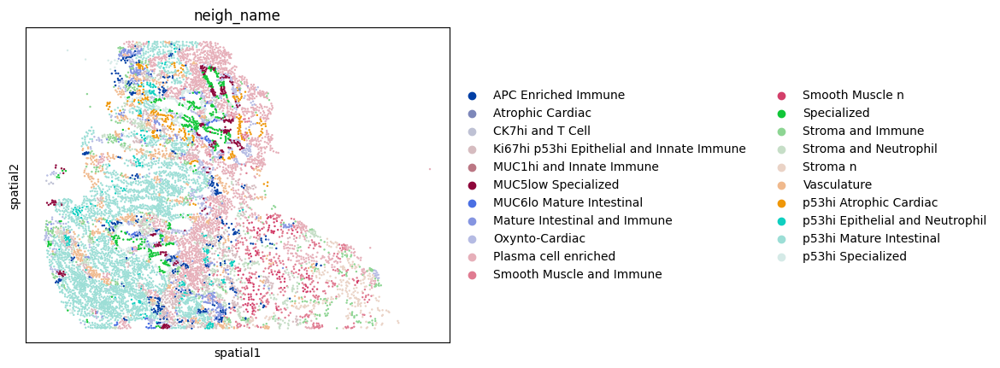

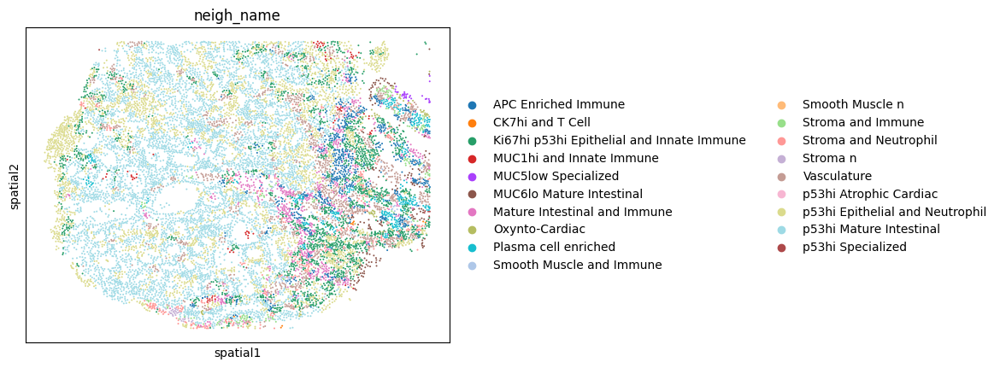

In [6]:
for sample in ['E08_reg002','E08_reg007','E08_reg001','E08_reg004']:
    sc.pl.embedding(mdata[sample], basis='spatial', color=['neigh_name'])

# Fig6F 

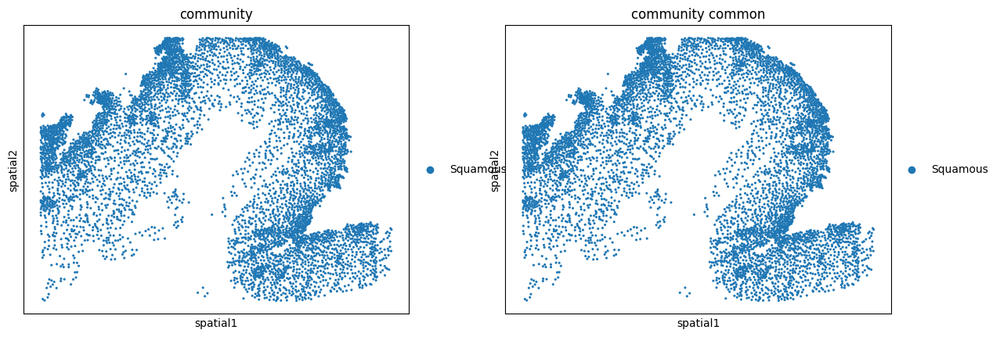

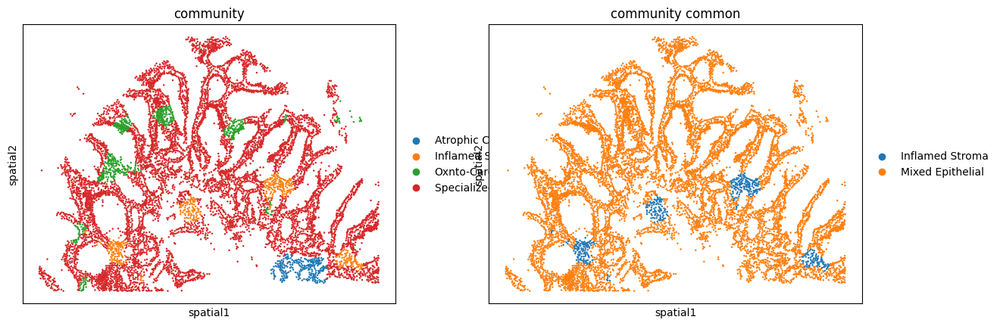

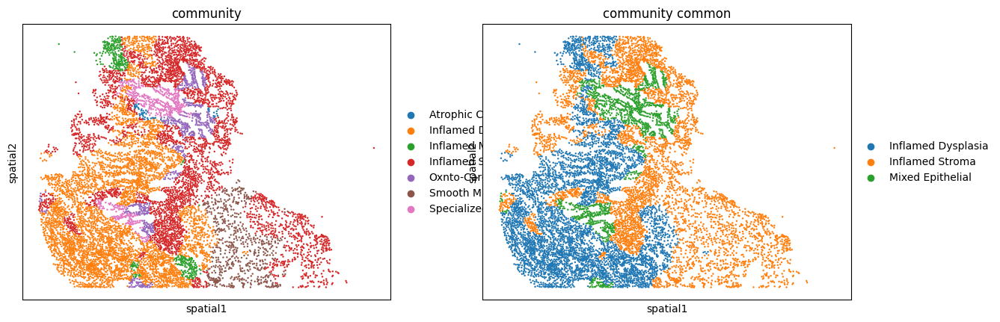

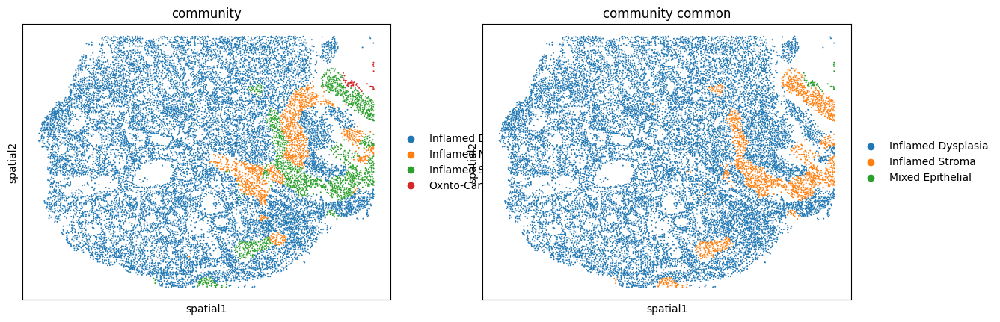

In [7]:
for sample in ['E08_reg002','E08_reg007','E08_reg001','E08_reg004']:
    sc.pl.embedding(mdata[sample], basis='spatial', color=['community', 'community common'])

# Fig 6D
calcualte the fraction of neighborhoods in each sample

In [9]:
f = []
for samplename in sorted(mdata.mod_names):
    freq_dict = mdata[samplename].obs.value_counts('neigh_name', normalize=True).to_dict()
    freq_dict['samplename'] = samplename
    f.append(freq_dict)
f = pd.DataFrame(f).replace({np.nan: 0})
f= f.merge(df_path,left_on='samplename', right_on='unique_region', )

In [10]:
f.head()

,p53hi Mature Intestinal,Plasma cell enriched,Ki67hi p53hi Epithelial and Innate Immune,Vasculature,Stroma and Neutrophil,Oxynto-Cardiac,Stroma and Immune,Smooth Muscle and Immune,APC Enriched Immune,Specialized,...,% invasive,% dysplasia,% metaplasia,% normal squamous,% HG dysplasia,% LG dysplasia,% Glandular,% metaplasia (not glandular),consensus diagnosis,Sub diagnosis
0,0.271792,0.175153,0.067413,0.060896,0.055092,0.051629,0.041853,0.040530,0.037271,0.036762,...,3.333333,53.333333,43.333333,0.0,48.333333,5.0,0.0,43.333333,D,MD
1,0.000000,0.000000,0.000000,0.002017,0.000000,0.000000,0.000000,0.000000,0.000336,0.000000,...,0.000000,0.000000,0.000000,100.0,0.000000,0.0,0.0,0.000000,NE,NE
2,0.000000,0.000000,0.000000,0.002983,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,100.0,0.000000,0.0,0.0,0.000000,NE,NE
3,0.386665,0.022528,0.131469,0.083763,0.025108,0.004603,0.013112,0.004603,0.049867,0.000000,...,60.000000,33.333333,6.666667,0.0,33.333333,0.0,0.0,6.666667,T,MDT
4,0.200633,0.038518,0.155696,0.076093,0.019088,0.011384,0.002910,0.004793,0.030386,0.012925,...,50.000000,30.000000,20.000000,0.0,30.000000,0.0,0.0,20.000000,T,MDT


/opt/conda/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_smooth : Removed 26 rows containing missing values.


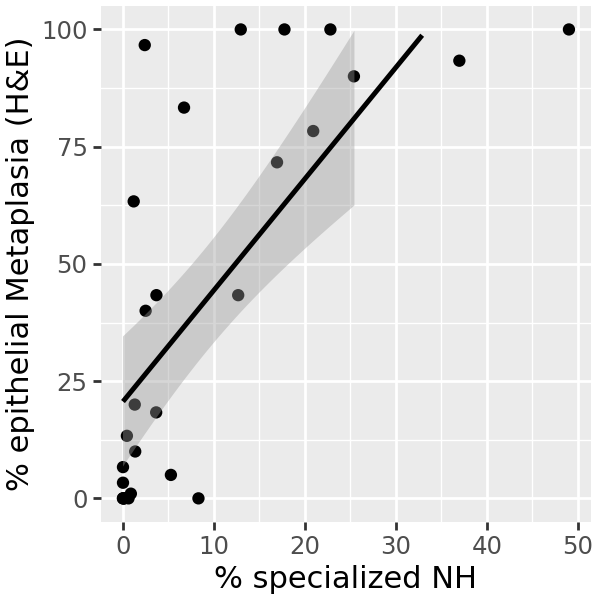

In [11]:
(
    pn.ggplot(f)
    + pn.aes(x='Specialized*100', y='% metaplasia')
    + pn.geom_point()
    + pn.geom_smooth(method="lm", )
    + pn.lims(y=[0,100])
    + pn.labs(x='% specialized NH', y='% epithelial Metaplasia (H&E)')
    +pn.theme(figure_size=(3,3))
)

# Fig 6G

In [12]:
f_comm = []
for samplename in sorted(mdata.mod_names):
    freq_dict = mdata[samplename].obs.value_counts('community', normalize=True).to_dict()
    freq_dict['samplename'] = samplename
    f_comm.append(freq_dict)
f_comm = pd.DataFrame(f_comm).replace({np.nan: 0})
f_comm= f_comm.merge(df_path,left_on='samplename', right_on='unique_region', )

def plot_comm_vs_he(community_name, h_e_percentage):
    return (
        pn.ggplot(f_comm)
        + pn.aes(x=community_name, y=h_e_percentage)
        + pn.geom_point()
        + pn.geom_smooth(method="lm", )
        + pn.lims(y=[0,100])
        +pn.theme(figure_size=(3,3))
    )

/opt/conda/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_smooth : Removed 14 rows containing missing values.


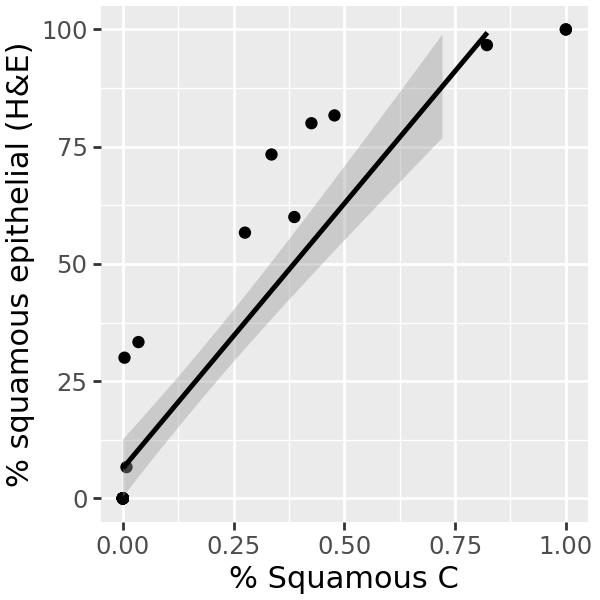

In [21]:
plot_comm_vs_he('Squamous', '% normal squamous')  + pn.labs(x='% Squamous C', y='% squamous epithelial (H&E)')

/opt/conda/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_smooth : Removed 20 rows containing missing values.


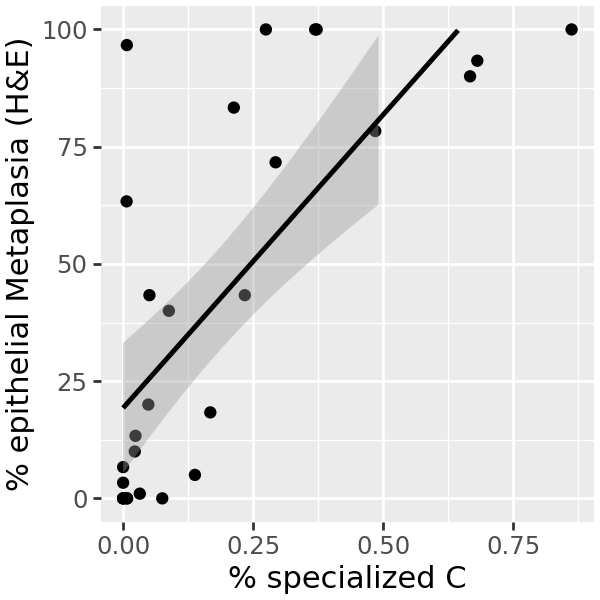

In [22]:
plot_comm_vs_he('Specialized c', '% metaplasia') + pn.labs(x='% specialized C', y='% epithelial Metaplasia (H&E)')

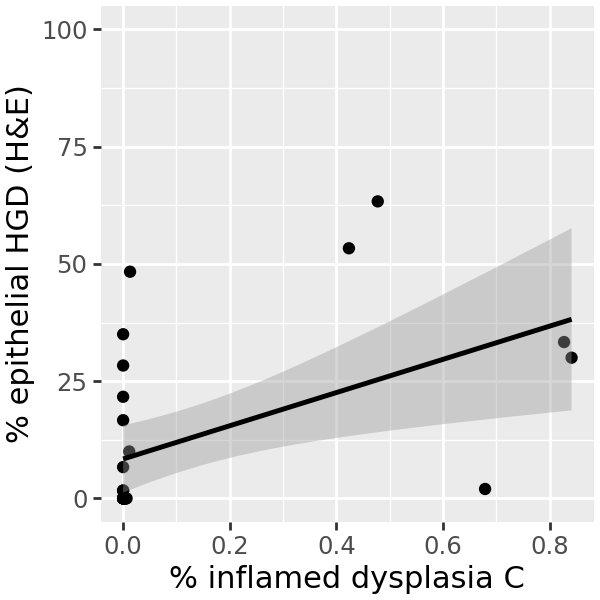

In [23]:
plot_comm_vs_he('Inflamed Dysplasia', '% dysplasia') + pn.labs(x='% inflamed dysplasia C', y='% epithelial HGD (H&E)')

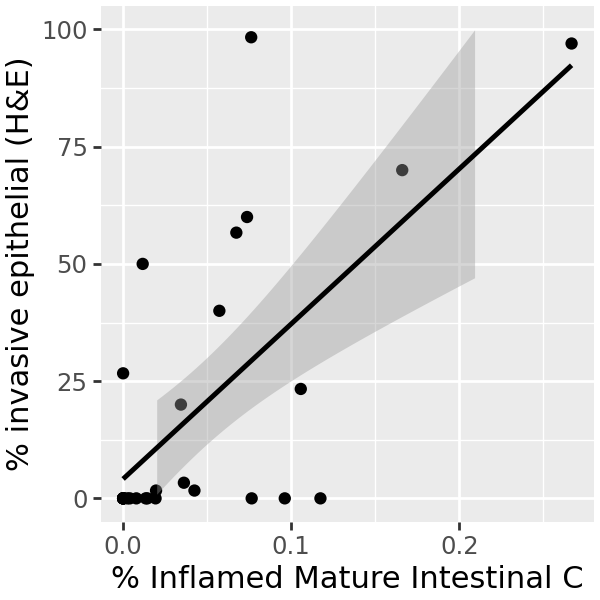

In [24]:
plot_comm_vs_he('Inflamed Mature Intestinal', '% invasive') + pn.labs(x='% Inflamed Mature Intestinal C', y='% invasive epithelial (H&E)')

# Fig6 O

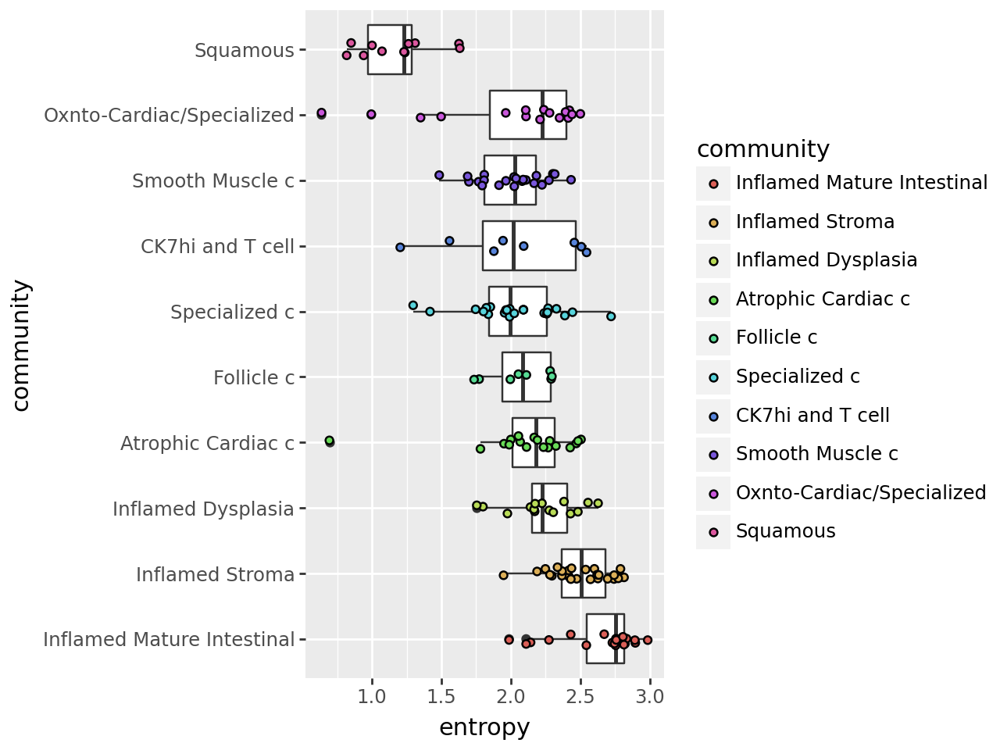

In [25]:
from scipy.stats import entropy

shannon_div = []
for samplename in sorted(mdata.mod_names):

    obs = mdata[samplename].obs
    # group by community, shannon entropy on cell type
    df_c = pd.crosstab(obs['Cell Type'], obs['community'])    
    probs = df_c / df_c.sum(0)

    for comm in probs.columns:
        e = entropy(probs[comm].values)
        shannon_div.append({
            'entropy': e,
            'community': comm,
            'samplename': samplename
        })
shannon_div = pd.DataFrame(shannon_div)

# just fixing the order of plotting
shannon_div['community'] = pd.Categorical(
    shannon_div['community'], 
    [
        'Squamous', 
        'Oxnto-Cardiac/Specialized',
        'Smooth Muscle c',
        'CK7hi and T cell',
         'Specialized c',
        'Follicle c',
        'Atrophic Cardiac c',
        'Inflamed Dysplasia',
        'Inflamed Stroma',
        'Inflamed Mature Intestinal'
    ][::-1])
pn.ggplot(shannon_div) + pn.aes(y='entropy', x='community') + pn.geom_boxplot() + pn.geom_jitter(pn.aes(fill='community'), height=0, width=0.1) + pn.coord_flip() 